# Exploring Differential RSFC Changes Imparted by Rapidly-acting Antidepressant Treatments

## NARSAD Aim 2 Project

### Benjamin Wade
### 11/23/2020

## Goal: Determine whether ECT, SKI, and TSD differentially affect patterns of between-network resting-state connectivity

* Use linear models to identify differential treatment-related changes in imaging measures
* Predict which subjects recieved which treatments given changes in imaging measures

In [1]:
## Resources: 
# Custom transformer: https://medium.com/analytics-vidhya/scikit-learn-pipelines-with-custom-transformer-a-step-by-step-guide-9b9b886fd2cc
# https://nilearn.github.io/auto_examples/03_connectivity/plot_group_level_connectivity.html
# See https://rmldj.github.io/hcp-utils/

import pandas as pd
import numpy as np
from os import path
import os
import hcp_utils as hcp
import nibabel as nib
from nilearn.connectome import ConnectivityMeasure
from nilearn import plotting
from nilearn import datasets
from glob import glob
from functools import reduce
#from chord import Chord
import pickle
import sklearn
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score, classification_report, balanced_accuracy_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict, cross_validate, GridSearchCV
from sklearn.feature_selection import RFECV, SelectKBest, f_classif
from sklearn.pipeline import Pipeline
import itertools
from itertools import chain
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.multivariate.manova import MANOVA
import statsmodels.stats.multicomp as mc
import matplotlib.pyplot as plt
from IPython.display import Image
import warnings
%matplotlib inline
#print(sklearn.__version__)

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
# Set parameters
atlas_name='mmp'
warnings.filterwarnings("ignore", category=DeprecationWarning) 

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

if atlas_name=='yeo17':
    labs=['VIS_1', 'VIS_2', 'MOT_1', 'MOT_2', 'DAN_1', 'DAN_2', 'SAL_VATTN_1', 'SAL_VATTN_2', 'LIM_1', 'LIM_2', 'FPN_1', 'Control_1', 'Control_2', 'TEMP_PAR', 'DMN_1', 'FPN_2', 'DMN_2', 'Hb_L', 'Hb_R']
elif atlas_name=='yeo7':
    for i, v in enumerate(hcp.yeo7.labels.values()):
        #print(i, v.replace(" ", "_"))
        hcp.yeo7.labels[i]=v.replace(" ", "_")
    labs=[getattr(hcp, atlas_name).labels[x] for x in getattr(hcp, atlas_name).labels if x > 0]
    labs.extend(['Hb_L', 'Hb_R'])
else:
    labs=[getattr(hcp, atlas_name).labels[x] for x in getattr(hcp, atlas_name).labels if x > 0]
    labs.extend(['Hb_L', 'Hb_R'])

# Background

## Effects of ECT on $\Delta$ RSFC

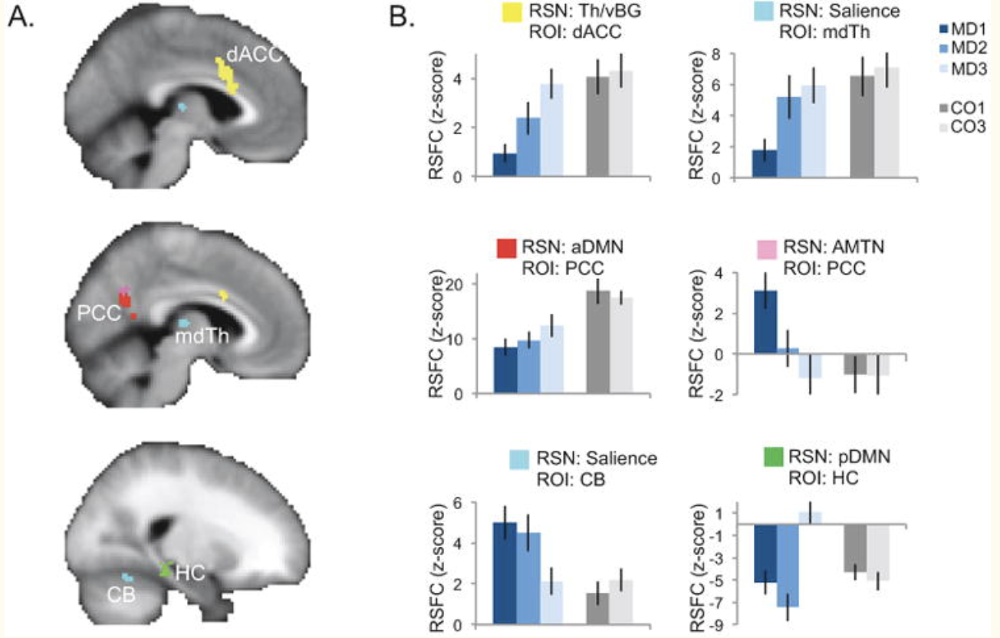

In [3]:
PATH = "/ifshome/bwade/NARSAD/Aim_2/presentations/figures/amber_ect_rsfc.png"
Image(filename = PATH, width=700, height=400)

* Normalization of RSFC between dACC (Salience network) and thalamus/ventral B.G. network
* Normalization of RSFC between PCC and aDMN/temporal network
* Overall, "ECT and clinical change were associated with RSFC modulation in dorsal ACC, mdTh and hippocampus"
* Leaver, 2015. 


## Effects of Ketamine on $\Delta$ RSFC

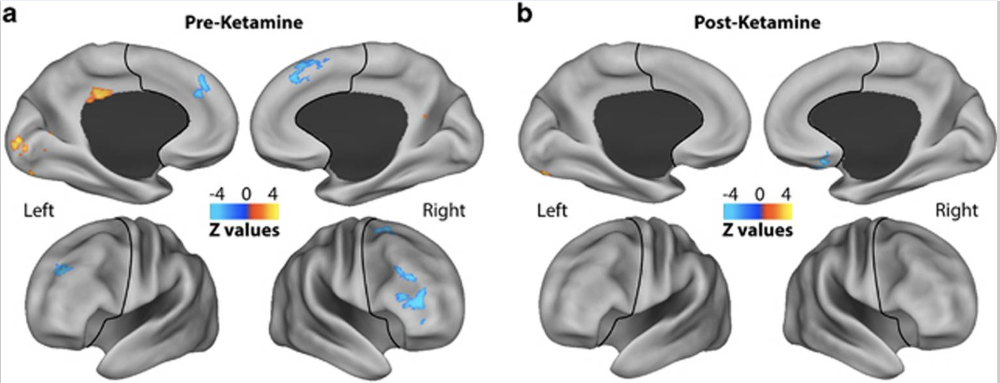

In [4]:
PATH = "/ifshome/bwade/NARSAD/Aim_2/presentations/figures/Abdallah_ketamine.png"
Image(filename = PATH, width=700, height=800)

* n=18 medication-free patients with treatment-resistant depression treated with ketamine (racemic, 0.5mg/kg).
* "High global \[disconnectivity\] in preketamine MDD compared with HC were found in the posterior cingulate, precuneus, and occipital cortices".
* The degree of regional disconnectivity largely normalized with ketamine. 
* Abdallah, 2016. 

## Effects of Sleep Deprivation on $\Delta$ RSFC

* Neuroimaging studies of TSD are limited
* Increased metabolic activity (PET imaging) of ventral ACC indicative of better outcomes
* Greater decreases in vACC activity with TSD correlates with better treatment outcomes (Clark, 2006)

# Methods

### Imaging data

1. Average AP/PA resting state runs (Atlas_MSMAll_Test_hp2000_clean.dtseries)
2. Parcellate RSFC data using NiLearn & HCP utilities extension 
3. Compute between-network partial correlation matrices including habenula time series data
4. $\Delta$ RSFC taken as TP2 - TP1
5. Unfold subject-level 19-by-19 matrices for data matrix of N-by-171

In [5]:
# Load demographic/clinical data

dem_path='/ifshome/bwade/NARSAD/Aim_2/data/'

# dem=pd.read_csv(dem_path + 'U01_Demographics.csv')
# rrsr=pd.read_csv(dem_path + 'rrsr_change.csv')
# hdrs=pd.read_csv(dem_path + 'hdrs_6_change.csv')

# rrsr=rrsr.rename(columns={'outcome': 'rrsr', 'screen_id': 'Subject'})
# hdrs=hdrs.rename(columns={'outcome': 'hdrs6', 'screen_id': 'Subject'})

# dem=dem.drop(['Unnamed: 0'], axis=1)
# rrsr=rrsr.drop(['Unnamed: 0'], axis=1)
# hdrs=hdrs.drop(['Unnamed: 0'], axis=1)

# dlist=[dem, rrsr, hdrs]
# dem=reduce(lambda  left,right: pd.merge(left,right,on=['Subject'], how='outer'), dlist)

dem=pd.read_csv(dem_path+'clinical_demographic_data_12012020.csv')

# Get iterable list of subject IDs with time points
sid_list=dem['Subject'].tolist()
arm_list=dem['arm'].tolist()
sid_list=[x for x in sid_list]
arm_list=[x for x in arm_list]

# Get list of controls
control_ids=pd.read_csv('/ifshome/bwade/NARSAD/Aim_2/data/control_ids.csv')
control_list=[x[:5] for x in control_ids['Subject']]

### Generate data

In [6]:
# Function to load and concatenate time series from whole brain and habenula
def img_loader(img_file, hbl_file, hbr_file):
    img=nib.load(img_file)
    img=img.get_fdata() # get data
    hbr=nib.load(hbr_file)
    hbr=hbr.get_fdata()
    hbl=nib.load(hbl_file)
    hbl=hbl.get_fdata()
    img_cat=np.concatenate((img, hbl, hbr), axis=1)  
    return img_cat

# RSFC data generator
def write_rsfc_change(sid_list, root_dir, hb_root_dir, atlas):
    
    for index, subj in enumerate(sid_list):
        
        print(index, subj)
                
        im_file_ap_baseline=root_dir + subj + '01' + '/MNINonLinear/Results/rest_acq-AP_run-01/rest_acq-AP_run-01_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
        im_file_pa_baseline=root_dir + subj + '01' + '/MNINonLinear/Results/rest_acq-PA_run-02/rest_acq-PA_run-02_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
        
        hb_r_file_ap_baseline=hb_root_dir + subj + '01/' + 'HbR_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'01')
        hb_l_file_ap_baseline=hb_root_dir + subj + '01/' + 'HbL_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'01')
        hb_r_file_pa_baseline=hb_root_dir + subj + '01/' + 'HbR_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'01')
        hb_l_file_pa_baseline=hb_root_dir + subj + '01/' + 'HbL_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'01')
        
        if subj[0]=='s' or subj[0]=='h':
            im_file_ap_followup=root_dir + subj + '02' + '/MNINonLinear/Results/rest_acq-AP_run-01/rest_acq-AP_run-01_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
            im_file_pa_followup=root_dir + subj + '02' + '/MNINonLinear/Results/rest_acq-PA_run-02/rest_acq-PA_run-02_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
            
            hb_r_file_ap_followup=hb_root_dir + subj + '02/' + 'HbR_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'02')
            hb_l_file_ap_followup=hb_root_dir + subj + '02/' + 'HbL_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'02')
            hb_r_file_pa_followup=hb_root_dir + subj + '02/' + 'HbR_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'02')
            hb_l_file_pa_followup=hb_root_dir + subj + '02/' + 'HbL_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'02')
            
        else:        
            im_file_ap_followup=root_dir + subj + '03' + '/MNINonLinear/Results/rest_acq-AP_run-01/rest_acq-AP_run-01_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
            im_file_pa_followup=root_dir + subj + '03' + '/MNINonLinear/Results/rest_acq-PA_run-02/rest_acq-PA_run-02_Atlas_MSMAll_Test_hp2000_clean.dtseries.nii'
            
            hb_r_file_ap_followup=hb_root_dir + subj + '03/' + 'HbR_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'03')
            hb_l_file_ap_followup=hb_root_dir + subj + '03/' + 'HbL_{}_MeanTS_drest-AP.sdseries.nii'.format(subj+'03')
            hb_r_file_pa_followup=hb_root_dir + subj + '03/' + 'HbR_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'03')
            hb_l_file_pa_followup=hb_root_dir + subj + '03/' + 'HbL_{}_MeanTS_drest-PA.sdseries.nii'.format(subj+'03')

        if path.exists(im_file_ap_baseline) and path.exists(im_file_pa_baseline) and path.exists(im_file_ap_followup) and path.exists(im_file_pa_followup) and path.exists(hb_l_file_pa_followup):   
            
            # load ap acquisitions: baseline
            img_ap_baseline_cat=img_loader(img_file=im_file_ap_baseline, 
                                           hbl_file=hb_l_file_ap_baseline, 
                                           hbr_file=hb_r_file_ap_baseline)

            # load pa acquisitions: baseline
            img_pa_baseline_cat=img_loader(img_file=im_file_pa_baseline, 
                               hbl_file=hb_l_file_pa_baseline, 
                               hbr_file=hb_r_file_pa_baseline)                    
            
            # average baseline runs and normalize
            img_baseline=np.mean((img_ap_baseline_cat, img_pa_baseline_cat),axis=0)
            img_baseline_norm=hcp.normalize(img_baseline) 
            
            # load ap acquisitions: followup
            img_ap_followup_cat=img_loader(img_file=im_file_ap_followup, 
                                           hbl_file=hb_l_file_ap_followup, 
                                           hbr_file=hb_r_file_ap_followup)             

            # load pa acquisitions: followup
            img_pa_followup_cat=img_loader(img_file=im_file_pa_followup, 
                               hbl_file=hb_l_file_pa_followup, 
                               hbr_file=hb_r_file_pa_followup)                        
            
            # average followup runs and normalize
            img_followup=np.mean((img_ap_followup_cat, img_pa_followup_cat),axis=0)
            img_followup_norm=hcp.normalize(img_followup)

            ## Atlas Parcellations
            # get regional time series
            hb_timeseries_baseline=img_baseline_norm[:, -2:]
            hb_timeseries_followup=img_followup_norm[:, -2:]
            
            img_timeseries_baseline=hcp.parcellate(img_baseline_norm[:,:-2], getattr(hcp, atlas))
            img_timeseries_followup=hcp.parcellate(img_followup_norm[:,:-2], getattr(hcp, atlas))                                            

            # compute correlation matrices
            correlation_measure=ConnectivityMeasure(kind='partial correlation')
            correlation_matrix_baseline=correlation_measure.fit_transform([np.concatenate((img_timeseries_baseline, hb_timeseries_baseline), axis=1)])[0]
            correlation_matrix_followup=correlation_measure.fit_transform([np.concatenate((img_timeseries_followup, hb_timeseries_followup), axis=1)])[0]
            
            # get matrix of changes T2 - T1
            difference_matrix=np.subtract(correlation_matrix_followup, correlation_matrix_baseline)
            
            # save matrix
            outfile='/ifshome/bwade/NARSAD/Aim_2/data/rsfc/' + subj + '_{}_atlas.npy'.format(atlas)
            np.save(outfile, difference_matrix)

        else: pass

#write_rsfc_change(sid_list=sid_list, root_dir='/nafs/narr/canderson/new_pipeline_test_runs/out/', hb_root_dir='/nafs/narr/HCP_OUTPUT/Habenula/outputs/RSConn_HbSeed/ROI_Timeseries/HbROIs/', atlas=atlas_name)

### Load data

In [7]:
# Load data
def make_xy():

    X=np.array([])
    y=[]
    id_list=[]
    u=0
    for index, subj in enumerate(sid_list):    
        fid='/ifshome/bwade/NARSAD/Aim_2/data/rsfc/' + sid_list[index] + '_{}_atlas.npy'.format(atlas_name)

        if path.exists(fid):
            conn=np.load(fid)
            conn_reshape=conn[np.triu_indices(len(conn), k=1)]        
            y.append(dem['arm'].iloc[index])
            id_list.append(subj)

            if u==0:
                X=conn_reshape
                u+=1
            else:
                X=np.vstack([X, conn_reshape]) 

        else:
            pass

    # numeric encoding of outcome
    le=preprocessing.LabelEncoder()
    le.fit(y)
    y=le.transform(y)
    
    return X, y, id_list

X, y, id_keep = make_xy()

# Names of connectivity pairs
def named_pairs(labs):
    x_names=[]
    for i in labs:
        for j in labs:
            x_names.append('{}_{}'.format(i, j))
    x_names=np.reshape(x_names, (len(labs), len(labs)))
    x_names=x_names[np.triu_indices(len(x_names), k=1)]
    return x_names

xn=named_pairs(labs)
X=pd.DataFrame(X, columns=xn)

def load_control_x():
    
    # prefilter control list
    control_list_red=[] 
    [control_list_red.append(x) for x in control_list if x not in control_list_red] 
    
    X_cont=np.array([])
    id_list=[]
    u=0
    for index, subj in enumerate(control_list_red):    
        fid='/ifshome/bwade/NARSAD/Aim_2/data/rsfc/' + control_list_red[index] + '_{}_atlas.npy'.format(atlas_name)

        if path.exists(fid):
            conn=np.load(fid)
            conn_reshape=conn[np.triu_indices(len(conn), k=1)]        
            id_list.append(subj)

            if u==0:
                X_cont=conn_reshape
                u+=1
            else:
                X_cont=np.vstack([X_cont, conn_reshape]) 

        else:
            pass
    
    return X_cont

X_Control=load_control_x()
X_Control=pd.DataFrame(X_Control, columns=xn)

X.head()

,L_V1_L_MST,L_V1_L_V6,L_V1_L_V2,L_V1_L_V3,L_V1_L_V4,L_V1_L_V8,L_V1_L_4,L_V1_L_3b,L_V1_L_FEF,L_V1_L_PEF,...,thalamus_left_thalamus_right,thalamus_left_brainStem,thalamus_left_Hb_L,thalamus_left_Hb_R,thalamus_right_brainStem,thalamus_right_Hb_L,thalamus_right_Hb_R,brainStem_Hb_L,brainStem_Hb_R,Hb_L_Hb_R
0,-0.074630,0.053940,0.026484,-0.036085,0.013184,-0.047253,-0.083242,0.043019,0.033639,-0.025876,...,0.027385,0.017317,0.027640,-0.057786,0.049276,0.057684,-0.012813,0.016909,-0.034029,0.011349
1,0.081721,0.048356,0.048659,-0.031183,0.026977,-0.135466,0.022707,0.011477,0.021519,-0.035551,...,-0.122038,-0.029111,0.095942,-0.056150,-0.004183,0.030130,0.029239,-0.004313,0.034378,-0.141813
2,0.103446,0.044764,-0.011671,-0.036682,0.097070,0.015070,0.000640,-0.006276,0.035859,-0.009432,...,0.036536,0.028014,0.006578,-0.040462,0.031577,-0.048849,0.026525,-0.006221,0.021020,0.108021
3,-0.060781,0.050441,-0.037281,-0.084907,-0.024723,0.016658,0.011693,-0.009290,0.032266,0.051457,...,-0.025944,0.013312,0.037956,-0.054377,0.007615,-0.010570,0.012458,-0.044141,0.013753,-0.019045
4,-0.027556,0.078921,0.005804,-0.020893,0.047443,-0.008510,0.043109,-0.001341,-0.045358,-0.076845,...,-0.003312,-0.004093,-0.018224,0.046357,0.013544,0.049677,0.025377,-0.030440,0.014401,0.063914


In [8]:
# atlas_labs=[x for x in hcp.mmp.labels.values()]
# atlas_labs.append('Hb_L')
# atlas_labs.append('Hb_R')
# #atlas_labs=['VIS_1', 'VIS_2', 'MOT_1', 'MOT_2', 'DAN_1', 'DAN_2', 'SAL_VATTN_1', 'SAL_VATTN_2', 'LIM_1', 'LIM_2', 'FPN_1', 'Control_1', 'Control_2', 'TEMP_PAR', 'DMN_1', 'FPN_2', 'DMN_2', 'Hb_L', 'Hb_R']
# with open('/ifshome/bwade/NARSAD/Aim_1/data/atlas_rsfc/mmp_labels.txt', 'w') as filehandle:
#     for listitem in atlas_labs:
#         filehandle.write('%s\n' % listitem)

### Yeo-7 Atlas

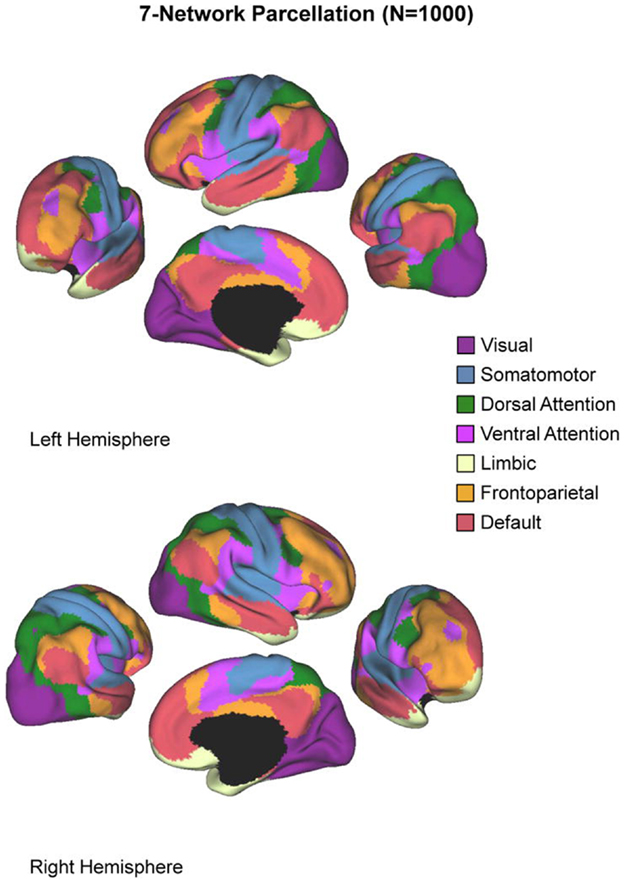

In [9]:
PATH = "/ifshome/bwade/NARSAD/Aim_2/presentations/figures/Yeo_7_Atals.png"
Image(filename = PATH, width=500, height=400)

### Yeo-17 Atlas

In [10]:
mesh_sub=hcp.load_surfaces(example_filename='/nafs/narr/HCP_OUTPUT/e001001/MNINonLinear/fsaverage_LR32k/sub-e001001.R.pial.32k_fs_LR.surf.gii')
hcp.view_parcellation(mesh_sub.inflated, getattr(hcp, 'yeo17'))

In [11]:
print(labs)

['L_V1', 'L_MST', 'L_V6', 'L_V2', 'L_V3', 'L_V4', 'L_V8', 'L_4', 'L_3b', 'L_FEF', 'L_PEF', 'L_55b', 'L_V3A', 'L_RSC', 'L_POS2', 'L_V7', 'L_IPS1', 'L_FFC', 'L_V3B', 'L_LO1', 'L_LO2', 'L_PIT', 'L_MT', 'L_A1', 'L_PSL', 'L_SFL', 'L_PCV', 'L_STV', 'L_7Pm', 'L_7m', 'L_POS1', 'L_23d', 'L_v23ab', 'L_d23ab', 'L_31pv', 'L_5m', 'L_5mv', 'L_23c', 'L_5L', 'L_24dd', 'L_24dv', 'L_7AL', 'L_SCEF', 'L_6ma', 'L_7Am', 'L_7PL', 'L_7PC', 'L_LIPv', 'L_VIP', 'L_MIP', 'L_1', 'L_2', 'L_3a', 'L_6d', 'L_6mp', 'L_6v', 'L_p24pr', 'L_33pr', 'L_a24pr', 'L_p32pr', 'L_a24', 'L_d32', 'L_8BM', 'L_p32', 'L_10r', 'L_47m', 'L_8Av', 'L_8Ad', 'L_9m', 'L_8BL', 'L_9p', 'L_10d', 'L_8C', 'L_44', 'L_45', 'L_47l', 'L_a47r', 'L_6r', 'L_IFJa', 'L_IFJp', 'L_IFSp', 'L_IFSa', 'L_p9-46v', 'L_46', 'L_a9-46v', 'L_9-46d', 'L_9a', 'L_10v', 'L_a10p', 'L_10pp', 'L_11l', 'L_13l', 'L_OFC', 'L_47s', 'L_LIPd', 'L_6a', 'L_i6-8', 'L_s6-8', 'L_43', 'L_OP4', 'L_OP1', 'L_OP2-3', 'L_52', 'L_RI', 'L_PFcm', 'L_PoI2', 'L_TA2', 'L_FOP4', 'L_MI', 'L_Pir', 'L

#### Average change in correlation (T2-T1) by treatment arm

In [12]:
ca={}
for tx in ['e', 'k', 's', 'h']:
    fid=glob('/ifshome/bwade/NARSAD/Aim_2/data/rsfc/{}*{}*.npy'.format(tx, atlas_name))
    connarray=np.load(fid[0])
    for f in fid[1:]:
        tmp=np.load(f)
        connarray=np.dstack([connarray, tmp])
    ca[tx]=connarray

/nafs/narr/bwade/apps/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  del sys.path[0]


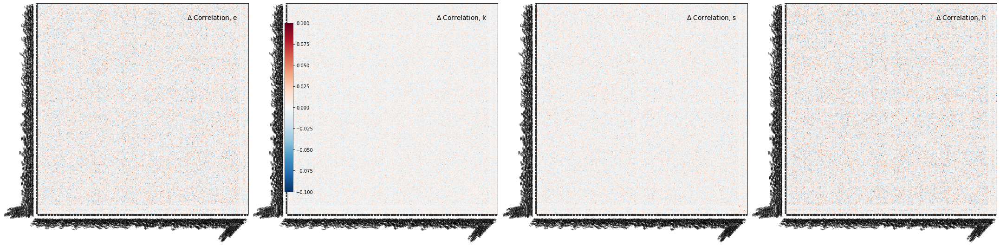

In [13]:
fig, axes = plt.subplots(1, 4, figsize=(30, 15))    
for idx, (arm, ax) in enumerate(zip(['e', 'k', 's', 'h'], axes)):
    arrave=np.mean(ca[arm], axis=2)
    if idx>0: 
        cb=False
    else:
        cb=True
        
    plotting.plot_matrix(arrave, labels=labs, axes=ax,
                         vmax=.1, vmin=-.1, reorder=False,
                         title='$\Delta$ Correlation, {}'.format(arm),
                        colorbar=cb)
plt.tight_layout(pad=1)
plt.show()

### Cohort demographics

In [14]:
# subset demographics by subjects with necessary data
dem=dem[[x in id_keep for x in dem['Subject']]]

# summarize demographics
pd.pivot_table(dem, index='arm', 
               values=['age', 'sex'], 
               aggfunc={'age': [len, np.mean, np.std], 
                        'sex': np.sum})

age                       sex
      len       mean        std sum
arm                                
e    20.0  37.400000  13.023865   7
k    60.0  40.133333  11.163601  30
s    49.0  32.632653  10.156471  21

17 control participants were also included for comparison. 

In [15]:
# Function to test between-gorup differences in continuous outcomes
def demographics_anova(dem_outcome):

    mod=ols('{} ~ C(arm)'.format(dem_outcome), data=dem).fit()
    aov_table = sm.stats.anova_lm(mod, typ=2) 
    print(aov_table)

    # posthoc tests
    comp = mc.MultiComparison(dem[dem_outcome], dem['arm'])
    post_hoc_res = comp.tukeyhsd()
    print(post_hoc_res.summary())
    sns.set(rc={'figure.figsize':(8,5)})
    sns.boxplot(x=dem['arm'],y=dem[dem_outcome])

                sum_sq     df         F   PR(>F)
C(arm)     1524.367284    2.0  6.184993  0.00274
Residual  15527.121088  126.0       NaN      NaN
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     e      k   2.7333 0.5995  -4.0652  9.5318  False
     e      s  -4.7673 0.2419  -11.754  2.2193  False
     k      s  -7.5007 0.0018 -12.5706 -2.4308   True
-----------------------------------------------------


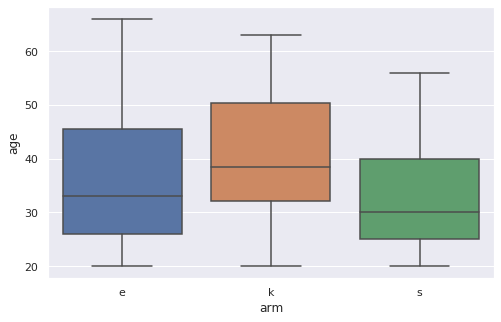

In [16]:
demographics_anova('age')

               sum_sq     df          F    PR(>F)
C(arm)     325.653504    2.0  13.282561  0.000006
Residual  1544.594558  126.0        NaN       NaN
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     e      k  -2.3667 0.0267 -4.5109 -0.2224   True
     e      s   1.0449 0.5018 -1.1587  3.2485  False
     k      s   3.4116  0.001  1.8125  5.0106   True
----------------------------------------------------


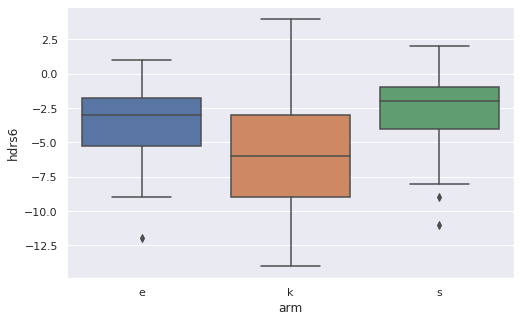

In [17]:
demographics_anova('hdrs6')

#### Six-item Hamilton Depression Rating Scale
1. Depressed Mood
2. Guilt
3. Work and Interests
4. Psychomotor Retardation
5. Anxiety, Psychic
6. Somatic Symptoms, General

#### Single-subject correlation matrix

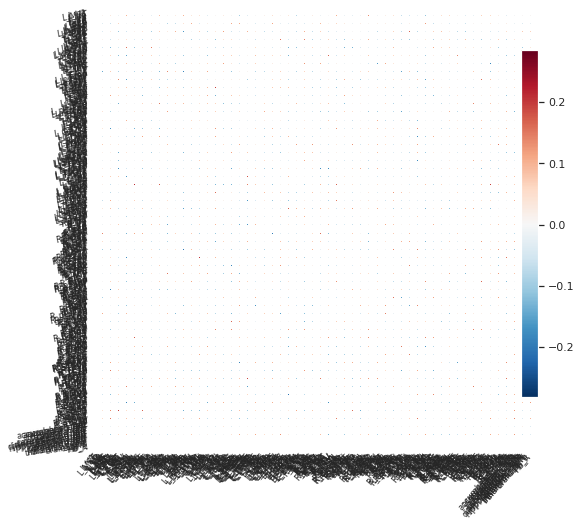

In [18]:
tmp=np.load('/ifshome/bwade/NARSAD/Aim_2/data/rsfc/e0011_{}_atlas.npy'.format(atlas_name))
        
plotting.plot_matrix(tmp, figure=(10, 8), labels=labs,
                     vmax=np.max(tmp), vmin=np.min(tmp), reorder=False)

## Statistical Methods

1. MANOVA omnibus test<br>
2. Machine learning to predict treatment arm given imaging changes<br>
    2.1 Post-hoc between-group tests of important features<br>
    2.2 Post-hoc associations between important features and depressive symptoms<br>

### Classification Pipeline

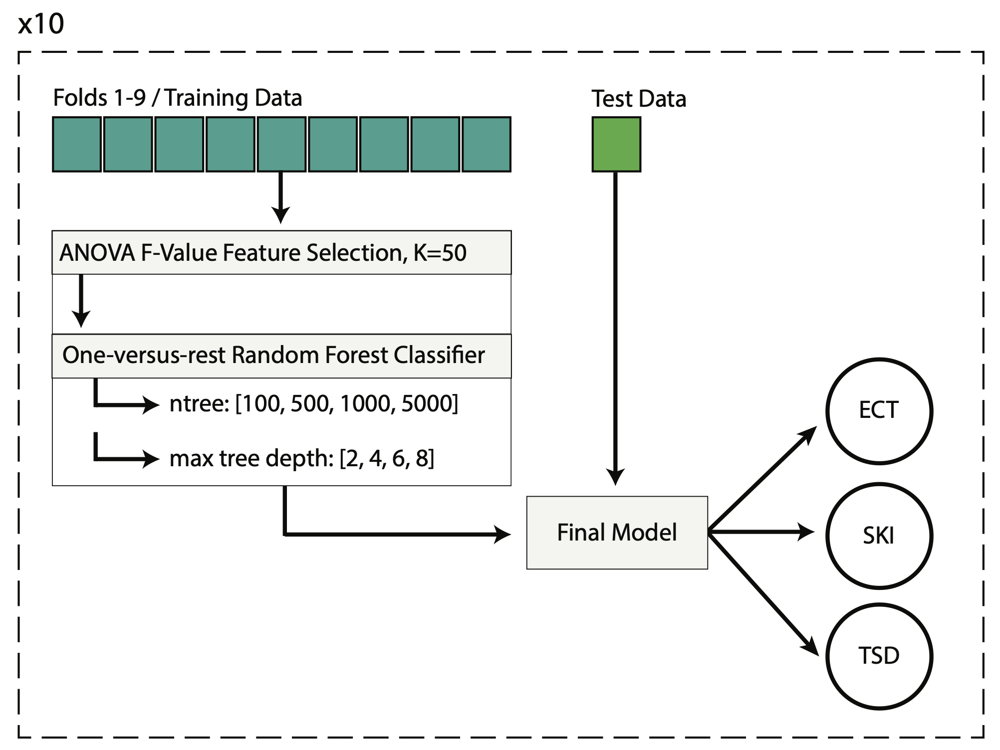

In [19]:
PATH = "/ifshome/bwade/NARSAD/Aim_2/presentations/figures/Classification_Pipeline.png"
Image(filename = PATH, width=700, height=400)

### Predict treatment arm

In [20]:
# define the model
model = OneVsRestClassifier(RandomForestClassifier(random_state=0, n_jobs=10))

# define search space
space = {'estimator__n_estimators': [100, 500, 1000, 5000],
         'estimator__max_depth': [2, 4, 6, 8]
}

# define nested grid search
cv_inner = KFold(n_splits=10, shuffle=True, random_state=1)
clf_nested_gs = GridSearchCV(model, space, cv=cv_inner, refit=True)

# configure the outer cross-validation procedure
cv_outer = KFold(n_splits=10, shuffle=True, random_state=1)

# performance metrics to record
scoring=['f1_micro', 'balanced_accuracy']

# execute the nested cross-validation
if atlas_name=='yeo17':
    pipeline = Pipeline([('anova_selection', SelectKBest(f_classif, k=50)), ('random_forest', clf_nested_gs)])
elif atlas_name=='yeo7':
    pipeline = Pipeline([('anova_selection', SelectKBest(f_classif, k=30)), ('random_forest', clf_nested_gs)])
else:
    pipeline = Pipeline([('anova_selection', SelectKBest(f_classif, k=100)), ('random_forest', clf_nested_gs)])

# # Not run
# scores=cross_validate(pipeline, X, y, cv=cv_outer, scoring=scoring, return_estimator=True)
# pred=cross_val_predict(pipeline, X, y, cv=cv_outer)

# # save results
# def save_obj(obj, name ):
#     with open(name + '.pkl', 'wb') as f:
#         pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

# save_obj(obj=scores, name='/ifshome/bwade/NARSAD/Aim_2/results/{}/nested_random_forest_model'.format(atlas_name))
# np.save(file='/ifshome/bwade/NARSAD/Aim_2/results/{}/nested_random_forest_pred'.format(atlas_name), arr=pred)

In [21]:
# Load model
def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)

scores=load_obj(name='/ifshome/bwade/NARSAD/Aim_2/results/{}/nested_random_forest_model'.format(atlas_name))
pred=np.load('/ifshome/bwade/NARSAD/Aim_2/results/{}/nested_random_forest_pred.npy'.format(atlas_name))

### Classification performance metrics

#### Balanced Accuracy
$
Sensitivity= \frac{True Positives}{True Positives + False Negatives} \\
$

Sensitivity is the ability of a test to correctly identify a condition.

$
Specificity= \frac{True Negatives}{True Negatives + False Positives} \\
$

Specificity is the ability of a test to identify cases in which the condition is absent. 

$
Balanced Accuracy= \frac{Sensitivity + Specificity}{2}\\
$

**Balanced accuracy** is the average of sensitivity and specificity. It is commonly used when classes are not balanced. 

#### F1 Score, precision & recall. 
$
Precision\ (Pos.\ Predictive\ Value)= \frac{True Positives}{True Positives + False Positives} \\
Recall\ =\ Sensitivity = \frac{True Positives}{True Positives + False Negatives} \\
$

Precision (or PPV) is the proportion of true cases among predicted cases. 

$
F1\ Score= 2 \cdot \frac{Precision \cdot Recall}{Precision + Recall}
$

The **F1 score** attempts to summarize the balance between precision and recall

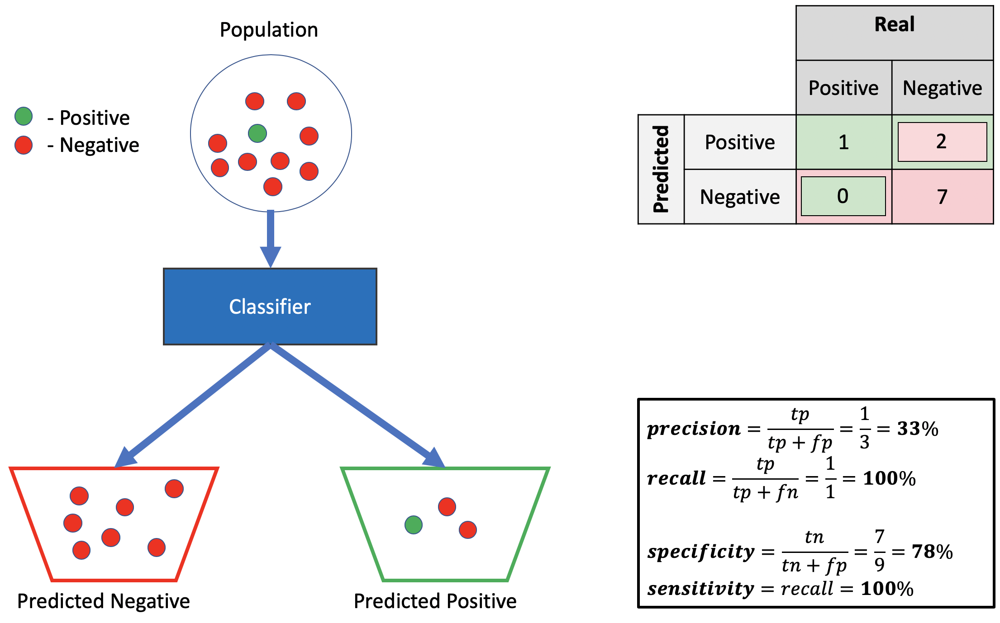

In [22]:
PATH = "/ifshome/bwade/NARSAD/Aim_2/presentations/figures/worked_sens_spec_example.png"
Image(filename = PATH, width=700, height=600)

# Results

### MANOVA results

In [23]:
manova_df=X.copy()
manova_df['arm']=y
manova_df['age']=dem['age']
manova_df['sex']=dem['sex']

outcome_string="+".join(X.columns[:90])
mancova_formula=outcome_string + '~ arm'
#print(mancova_formula)

In [25]:
# mod=MANOVA.from_formula(mancova_formula, data=manova_df)
# res=mod.mv_test()
# print(res)

#### PCA-MANOVA

In [26]:
n_pcs=100
pca=PCA(n_components=n_pcs)
pca.fit(X)
x_red=pca.fit_transform(X)

Text(0.5, 1.0, 'PC 2 by Treatment Arm')

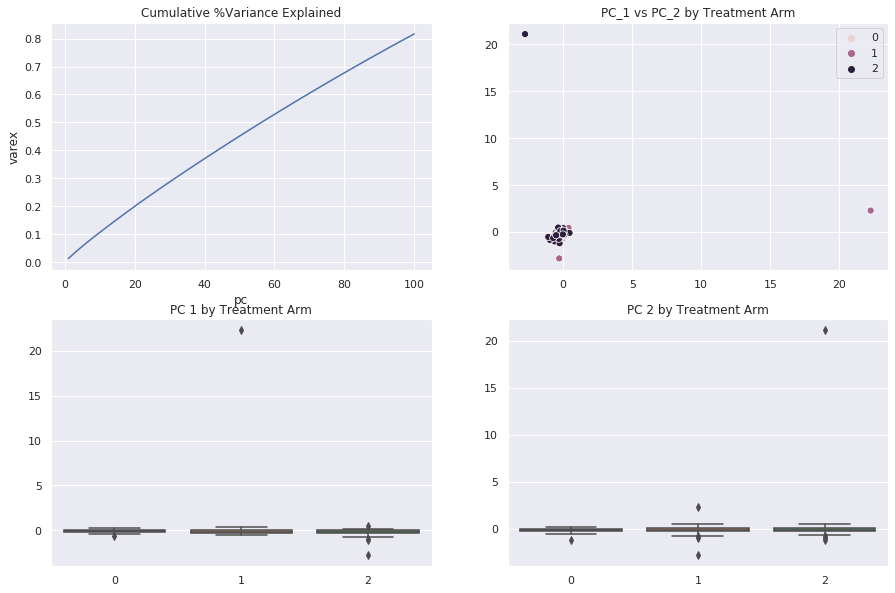

In [27]:
_, axes = plt.subplots(2, 2, figsize=(15,10))
axes=axes.reshape(-1)
pc_df=pd.DataFrame({'pc':[x for x in range(1, n_pcs+1)], 
                   'varex': pca.explained_variance_ratio_.cumsum()})

sns.lineplot(x='pc', y='varex', data=pc_df, ax=axes[0]).set_title('Cumulative %Variance Explained')
sns.scatterplot(x=x_red[:,0],y=x_red[:,1], hue=y, ax=axes[1], s=50).set_title('PC_1 vs PC_2 by Treatment Arm')
sns.boxplot(x=y, y=x_red[:, 0], ax=axes[2]).set_title('PC 1 by Treatment Arm')
sns.boxplot(x=y, y=x_red[:, 1], ax=axes[3]).set_title('PC 2 by Treatment Arm')

In [28]:
mod=MANOVA(endog=x_red, exog=y)
res=mod.mv_test()
print(res)

                  Multivariate linear model
                                                              
--------------------------------------------------------------
           x0           Value   Num DF   Den DF F Value Pr > F
--------------------------------------------------------------
          Wilks' lambda 0.7863 100.0000 29.0000  0.0788 1.0000
         Pillai's trace 0.2137 100.0000 29.0000  0.0788 1.0000
 Hotelling-Lawley trace 0.2718 100.0000 29.0000  0.0788 1.0000
    Roy's greatest root 0.2718 100.0000 29.0000  0.0788 1.0000



#### MANOVA conclusions
* No significant between-group differences at the omnibus level using the Yeo-17 atlas. 
* There were, however, omnibus results for the Yeo-7 atlas.

### Classification results

Overall Balanced Accuracy: 0.477 +/- 0.081
Baseline Balanced Accuracy: 0.465


[Text(0.5, 1.0, 'F1 Score')]

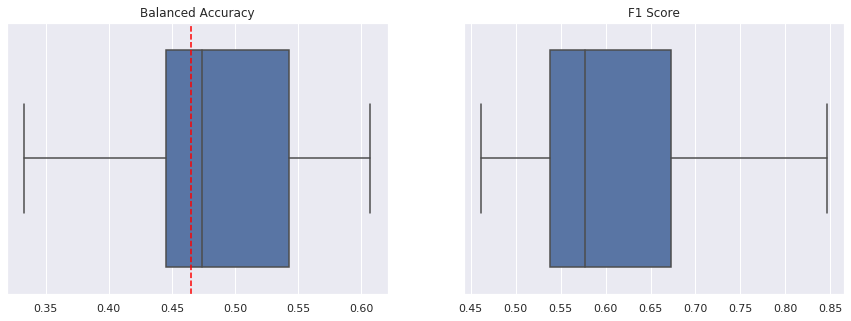

In [29]:
ba=60/129
print('Overall Balanced Accuracy: {:.3f} +/- {:.3f}'.format(np.mean(scores['test_balanced_accuracy']), 
                                                            np.std(scores['test_balanced_accuracy'])))
print('Baseline Balanced Accuracy: {:.3f}'.format(ba))

f, axes = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot(scores['test_balanced_accuracy'], ax=axes[0]).set(title='Balanced Accuracy')
axes[0].axvline(ba, color='red', linestyle='dashed')
sns.boxplot(scores['test_f1_micro'], ax=axes[1]).set(title='F1 Score')

In [30]:
# Performance by class
print(classification_report(y, pred, target_names=['ECT', 'SKI', 'TSD']))

              precision    recall  f1-score   support

         ECT       0.00      0.00      0.00        20
         SKI       0.56      0.83      0.67        60
         TSD       0.72      0.59      0.65        49

    accuracy                           0.61       129
   macro avg       0.43      0.48      0.44       129
weighted avg       0.54      0.61      0.56       129



/nafs/narr/bwade/apps/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Permutation test

In [31]:
def permutation_null_distribution(X, y, pipeline, seed):
        if seed % 10 == 0: print(seed)
        np.random.seed(seed)
        y_shuffle=y.copy()
        np.random.shuffle(y_shuffle)
        assert(np.sum(y==y_shuffle) != len(y))
        perm_scores=cross_validate(pipeline, X, y_shuffle, cv=cv_outer, scoring=scoring, return_estimator=False)    
        perm_mean=np.mean(perm_scores['test_balanced_accuracy'])
        np.save('/ifshome/bwade/NARSAD/Aim_2/results/permutations/permutation_{}'.format(seed), arr=perm_mean)
        return perm_mean

## Not run: see batch script
# nd=[permutation_null_distribution(X, y, pipeline, p) for p in range(0, 100)] 
# np.save(file='/ifshome/bwade/NARSAD/Aim_2/results/permutation_distribution', arr=nd)


Permutation p-value: 0.010101


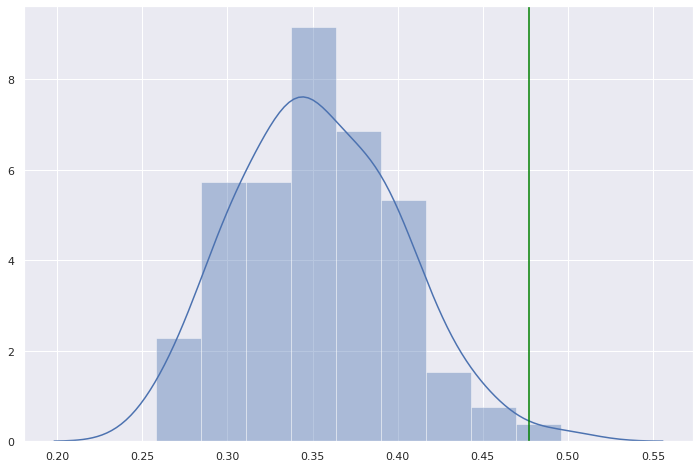

In [32]:
pfid=glob('/ifshome/bwade/NARSAD/Aim_2/results/{}/permutations/*.npy'.format(atlas_name))

nd=[]
for f in pfid:
    tmp=np.load(f)
    nd.append(tmp)

sns.set(rc={'figure.figsize':(12, 8)})
sns.distplot(nd)
plt.axvline(np.mean(scores['test_balanced_accuracy']), 0, 12, color='green')

switch=sum([x < np.mean(scores['test_balanced_accuracy']) for x in nd])
if switch==len(nd):
    print('Permutation p-value: {:2f}'.format(((np.sum([x >= np.mean(scores['test_balanced_accuracy']) for x in nd]) + 1 ) / (len(nd) + 1))))
else:
    print('Permutation p-value: {:2f}'.format(((np.sum([x >= np.mean(scores['test_balanced_accuracy']) for x in nd])) / (len(nd)))))

### Feature Importance

In [33]:
# Map selected feature importance to ordered list
importance_by_fold={}

u=0
for fold in scores['estimator']:
    mod=fold.named_steps['random_forest'].best_estimator_.estimators_
    selected_variables=X.columns[fold.named_steps['anova_selection'].get_support()]
    
    importance_by_arm={}
    for arm in range(3):
        
        variable_importance={}
        for var in X.columns:
            if var in selected_variables: 
                variable_importance[var]=mod[arm].feature_importances_[[i for i, x in enumerate(selected_variables==var) if x==True]][0] # assign corresponding feature importance
            else: 
                variable_importance[var]=0 # if not selected feature importance is zero
        
        importance_by_arm[arm]=variable_importance
    
    importance_by_fold[u]=importance_by_arm
    u+=1


vi={}
for i in range(3):
    vi[i]=pd.DataFrame({'Variable': X.columns, 
                 'Importance': np.mean(np.array([[x for x in importance_by_fold[y][i].values()] for y in range(10)]), axis=0)})

def make_sym_matrix(n,vals):
    m = np.zeros([n,n], dtype=np.double)
    xs,ys = np.triu_indices(n,k=1)
    m[xs,ys] = vals
    m[ys,xs] = vals
    return m

mat_dim=len(getattr(hcp, atlas_name).labels) + 1

ect_imp=make_sym_matrix(mat_dim, vi[0]['Importance'])
ski_imp=make_sym_matrix(mat_dim, vi[1]['Importance'])
tsd_imp=make_sym_matrix(mat_dim, vi[2]['Importance'])

def make_circos(matrix, width):

    tmp=matrix.copy()
    qt=[0.8, 0.95]
    val=[5., 10.]
    for (v, q) in zip(val, qt):        
        tmp[ect_imp>np.quantile(ect_imp, q)]=v
    tmp[ect_imp<np.quantile(ect_imp, np.min(qt))]=0

    Chord(tmp.tolist(), 
          labs, width=width, 
          font_size_large='10px', 
          padding=0.1, 
          wrap_labels=True).show()

In [34]:
# yeo = datasets.fetch_atlas_yeo_2011()
# coordinates = plotting.find_parcellation_cut_coords(labels_img=yeo['thick_17'])

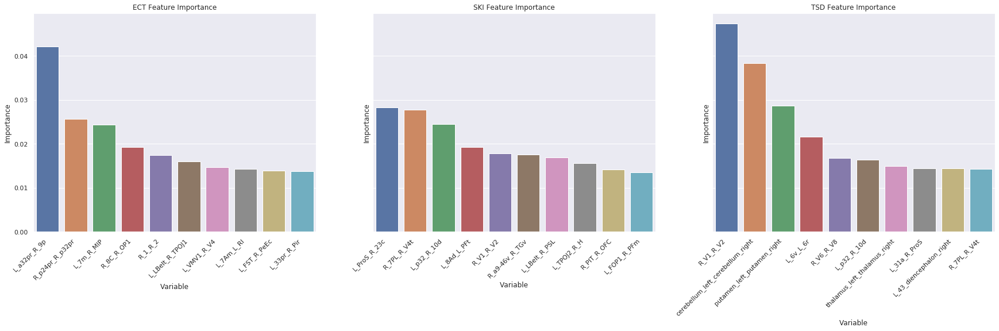

In [35]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7), sharey=True)

for idx, (tx, ax) in enumerate(zip(['ECT', 'SKI', 'TSD'], axes.reshape(-1))):
    g=sns.barplot(x='Variable', y='Importance', data = vi[idx].sort_values(by=['Importance'], ascending=False)[:10], ax=ax)
    ticks=g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
    g.set(title='{} Feature Importance'.format(tx))

### Are important features statistically different between groups? 

In [36]:
def anova_plots(X, X_Control, group, outcome, ax):    

    # add treatment group
    df_tmp=X.copy()
    df_tmp=df_tmp.append(X_Control)
    ytmp=[]
    
    for a in y_tmp:
        if a==0:
            ytmp.append('ECT')
        elif a==1:
            ytmp.append('SKI')
        elif a==2:
            ytmp.append('TSD')
        else:
            ytmp.append('CON')
        
    df_tmp['arm']=ytmp
    
    #print(df_tmp.head())
    print(ax)

    # plot
    sns.boxplot(x='arm',y=outcome, data=df_tmp, ax=ax)

    # run anova
    model = ols('{} ~ C(arm)'.format(outcome), data=df_tmp).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)    
    #print(aov_table)

    # posthoc tests
    comp = mc.MultiComparison(df_tmp[outcome], df_tmp['arm'])
    post_hoc_res = comp.tukeyhsd()
    #print(post_hoc_res.summary())

    # which contrasts are significant
    sig_indices=[idx for idx, p in enumerate(post_hoc_res.pvalues) if p<0.05]

    #map_index=[[0,1], [0,2], [1,2]] # array to map signifcant contrasts to plot indices
    map_index=[[3,0], [3,1], [3,2], [0,1], [0, 2], [1,2]]

    u=1 # just a multiplier for bar height
    for p in sig_indices:

        if post_hoc_res.pvalues[p] <=0.01: 
            marker='**'
        elif post_hoc_res.pvalues[p]<=0.001:
            marker='***'
        else:
            marker='*'

        # statistical annotation: https://stackoverflow.com/questions/36578458/how-does-one-insert-statistical-annotations-stars-or-p-values-into-matplotlib/37518947#37518947
        x1, x2 = map_index[p][0], map_index[p][1]   # significant columns (first column: 0, see plt.xticks())
        yp, h, col = df_tmp[outcome].max() + 0.15*u, 0.05, 'k'
        ax.plot([x1, x1, x2, x2], [yp, yp+h, yp+h, yp], lw=1.5, c=col)
        ax.text((x1+x2)*.5, yp+h, marker, ha='center', va='bottom', color=col)
        ax.set_title('{} $\Delta$ Correlation by Treatment Arm'.format(outcome))
        ax.set(ylabel="$\Delta$ Pearsons Correlation (TP2 - TP1)", xlabel='')
        u+=1
        
y_tmp=np.concatenate([y, [3]*X_Control.shape[0]])

In [39]:
def plot_networks(network_a, network_b, labs):

    img = nib.load('/nafs/narr/HCP_OUTPUT/e002301/MNINonLinear/Results/task-rest_acq-AP_run-01/task-rest_acq-AP_run-01_Atlas.dtseries.nii')
    X = img.get_fdata()
    Xn = hcp.normalize(X)
    Xn.shape
    
    network_index_a=[i for i, x in enumerate(labs) if x==network_a]
    network_index_b=[i for i, x in enumerate(labs) if x==network_b]
    
    plot_dat=np.array([1]*91282)
    plot_dat[getattr(hcp, atlas_name).map_all==network_index_a] = 2
    plot_dat[getattr(hcp, atlas_name).map_all==network_index_b] = -2
    
    return plotting.view_surf(mesh_sub.inflated, 
                       #hcp.cortex_data(hcp.mask(plot_dat, (hcp.yeo17.map_all==network_index_a) | (hcp.yeo17.map_all==network_index_b) )), 
                              hcp.cortex_data(hcp.mask(plot_dat, (getattr(hcp, atlas_name).map_all==network_index_a) | (getattr(hcp, atlas_name).map_all==network_index_b) )), 
                              threshold=0.1, 
                              bg_map=mesh_sub.sulc,
                              vmin=-3,
                              vmax=3)

#### ECT Group Features: Not predicted significantly so could ignore

AxesSubplot(0.125,0.125;0.227941x0.755)
AxesSubplot(0.398529,0.125;0.227941x0.755)
AxesSubplot(0.672059,0.125;0.227941x0.755)


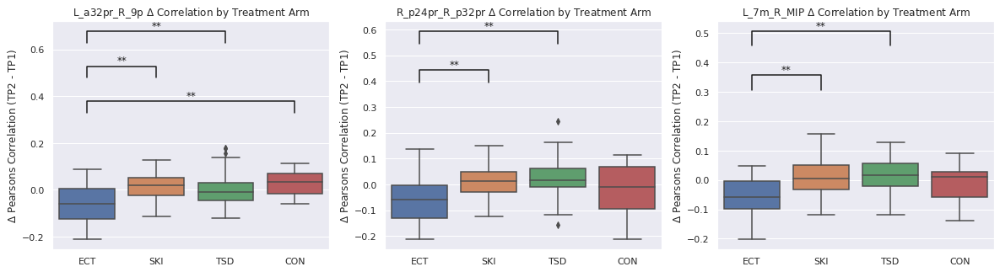

In [40]:
correlation_pairs=vi[0].sort_values(by=['Importance'], ascending=False)[:3]['Variable'].values

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
for idx, (outcome, ax) in enumerate(zip(correlation_pairs, axes.reshape(-1))):
    anova_plots(X=X, X_Control=X_Control, group=y_tmp, outcome=outcome, ax=ax)

In [41]:
plot_networks('L_a32pr', 'R_9p', labs=['']+labs)

/nafs/narr/bwade/apps/anaconda3/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


#### SKI Group Features

AxesSubplot(0.125,0.125;0.227941x0.755)
AxesSubplot(0.398529,0.125;0.227941x0.755)
AxesSubplot(0.672059,0.125;0.227941x0.755)


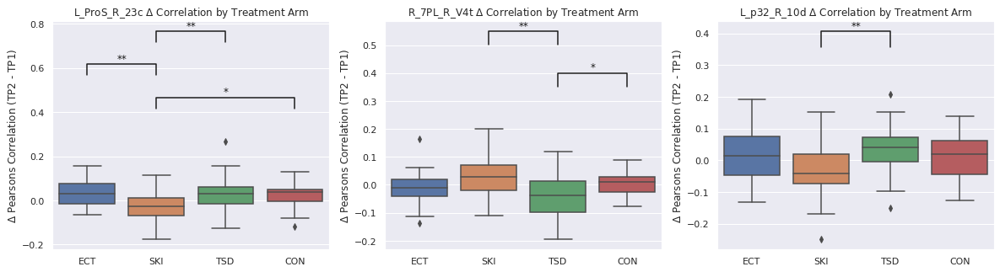

In [44]:
correlation_pairs=vi[1].sort_values(by=['Importance'], ascending=False)[:3]['Variable'].values

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
for idx, (outcome, ax) in enumerate(zip(correlation_pairs, axes.reshape(-1))):
    anova_plots(X=X, X_Control=X_Control, group=y_tmp, outcome=outcome, ax=ax)

In [ ]:
plot_networks('R_7PL', 'R_V4t', labs=['']+labs)

#### TSD Group Features

In [ ]:
correlation_pairs=vi[2].sort_values(by=['Importance'], ascending=False)[:3]['Variable'].values

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
for idx, (outcome, ax) in enumerate(zip(correlation_pairs, axes.reshape(-1))):
    anova_plots(X=X, X_Control=X_Control, group=y_tmp, outcome=outcome, ax=ax)

In [ ]:
plot_networks('VIS_2', 'Control_1', labs=['']+labs)

## Post-hoc associations with neuropsych

In [ ]:
## Should check within-group association before moving on to interaction
def regression_model_within_arm(conn_pair, arm):
    tmp=dem
    tmp['rsfc']=X[conn_pair].values    
    mod=ols(formula='hdrs6 ~ age + C(sex) + rsfc', data=tmp[tmp['arm']==arm])
    res=mod.fit()
    print('{} ~ HDRS-6 | {} p-value: {:2f}'.format(conn_pair, arm, res.pvalues['rsfc']))
    if res.pvalues['rsfc']<0.05:
        print(res.summary())
        sns.lmplot(x='rsfc', y='hdrs6', data=tmp[tmp['arm']==arm])
    return res

def regression_interaction_model(conn_pair):
    tmp=dem
    tmp['rsfc']=X[conn_pair].values
    mod=ols(formula='hdrs6 ~ age + C(sex) + rsfc*C(arm, Treatment(reference="s"))', data=tmp)
    res=mod.fit()
    if res.pvalues['rsfc:C(arm, Treatment(reference="s"))[T.e]'] < 0.05 or res.pvalues['rsfc:C(arm, Treatment(reference="s"))[T.k]'] < 0.05:    
        print('{} ~ HDRS'.format(conn_pair))
        print(res.summary())
        sns.lmplot(x='rsfc', y='hdrs6', hue='arm', data=tmp)
        ax.set(xlabel='{}'.format(conn_pair))
    return res

def plot_model(conn_pair, ax):
    tmp=dem
    tmp['rsfc']=X[conn_pair].values
    sns.lmplot(x='rsfc', y='hdrs6', hue='arm', data=tmp)

# Top three important features by treatment arm
c_pairs=['SAL_VATTN_2_Control_1', 'VIS_2_MOT_1', 'LIM_1_TEMP_PAR', 
         'LIM_1_FPN_2', 'SAL_VATTN_2_TEMP_PAR', 'MOT_1_TEMP_PAR',
        'SAL_VATTN_2_TEMP_PAR', 'VIS_2_Control_1', 'VIS_2_SAL_VATTN_1']

## Regression models within treatment arm
$
{HDRS_6}= \alpha + \beta_{1} Age + \beta_{2} Sex + \beta_{3} RSFC + \epsilon \ | \ treatment \ arm
$

In [ ]:
for (c, a) in zip(c_pairs, ['e', 'e', 'e', 'k', 'k', 'k', 's', 's', 's']):
    regression_model_within_arm(conn_pair=c, arm=a)

## Post-hoc regression models with interaction term
$
{HDRS_6}= \alpha + \beta_{1} Sex + \beta_{2} arm + \beta_{3} age + \beta_{4} RSFC + \beta_{5} RSFC \cdot arm + \epsilon \ 
$

In [ ]:
_=[regression_interaction_model(x) for x in c_pairs]

## Conclusions
* Omnibus tests of between-group differences were non-significant for Yeo-17 atlas despite PC1 loadings. 
* Among the SKI group, limbic, ventral attention, and temporo-parietal networks were most discriminative.
* Among the TSD group, ventral attention, visual, and temporo-parietal networks were discriminative.
* Broad changes in salience network (dACC/anterior insula) connectivity seem to loosely track with earlier reported findings. 
* Differential associations between $\Delta$ RSFC and the HDRS-6 were limited but associated differentially with ketamine group. 

### Limitations
* Generally, correlated changes were low (-0.1 to +0.1)
* Prediction of SKI and TSD was encouraging but ECT group is just too small to draw conclusions from.
* Few changes differed from the control group